In [17]:
!pip install opencv-python numpy

In [8]:
import cv2
import numpy as np
import os
import requests
import matplotlib.image as mpimg

In [9]:
def download_file(url, filename):
    response = requests.get(url)
    if response.status_code == 200:
        with open(filename, 'wb') as f:
            f.write(response.content)
        print(f"{filename} успешно скачан.")
    else:
        print(f"Не удалось скачать {filename}. Код состояния: {response.status_code}")
        exit()
weights_url = "https://pjreddie.com/media/files/yolov3.weights"
weights_path = 'yolov3.weights'
if not os.path.exists(weights_path):
    download_file(weights_url, weights_path)

Скачивание yolov3.weights...
yolov3.weights успешно скачан.


In [2]:
os.system("wget https://raw.githubusercontent.com/pjreddie/darknet/master/cfg/yolov3.cfg")
os.system("wget https://raw.githubusercontent.com/pjreddie/darknet/master/data/coco.names")

1

In [90]:
config_path = 'yolov3.cfg'
weights_path = 'yolov3.weights'
names_path = 'coco.names'

In [91]:
net = cv2.dnn.readNet(weights_path, config_path)

In [92]:
with open(names_path, 'r') as f:
    classes = [line.strip() for line in f.readlines()]

In [93]:
output_layers = net.getUnconnectedOutLayersNames()

In [94]:
img = cv2.imread('5.jpg')
height, width, channels = img.shape

In [95]:
blob = cv2.dnn.blobFromImage(img, 0.00392, (416, 416), (0, 0, 0), True, crop=False)
net.setInput(blob)
outs = net.forward(output_layers)

In [96]:
class_ids = []
confidences = []
boxes = []
for out in outs:
    for detection in out:
        scores = detection[5:]
        class_id = np.argmax(scores)
        confidence = scores[class_id]
        if confidence > 0.5:
            center_x = int(detection[0] * width)
            center_y = int(detection[1] * height)
            w = int(detection[2] * width)
            h = int(detection[3] * height)
           
            x = int(center_x - w / 2)
            y = int(center_y - h / 2)
            
            boxes.append([x, y, w, h])
            confidences.append(float(confidence))
            class_ids.append(class_id)

In [97]:
indexes = cv2.dnn.NMSBoxes(boxes, confidences, 0.5, 0.4)

In [98]:
font = cv2.FONT_HERSHEY_PLAIN
colors = np.random.uniform(0, 255, size=(len(classes), 3))
for i in range(len(boxes)):
    if i in indexes:
        x, y, w, h = boxes[i]
        label = str(classes[class_ids[i]])
        color = colors[class_ids[i]]
        cv2.rectangle(img, (x, y), (x + w, y + h), color, 2)
        cv2.putText(img, label, (x, y + 30), font, 3, color, 3)

In [99]:
output_image_path = 'detected_image5.jpg'
cv2.imwrite(output_image_path, img)

True

In [54]:
import matplotlib.pyplot as plt
img = mpimg.imread('detected_image.jpg')

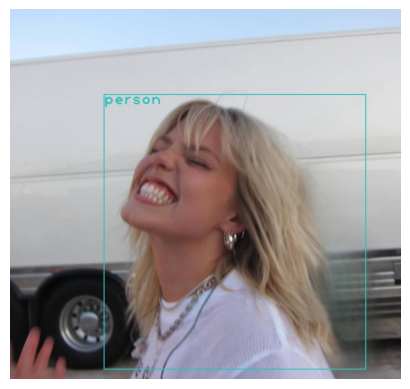

In [34]:
plt.imshow(img)
plt.axis('off') 
plt.show()

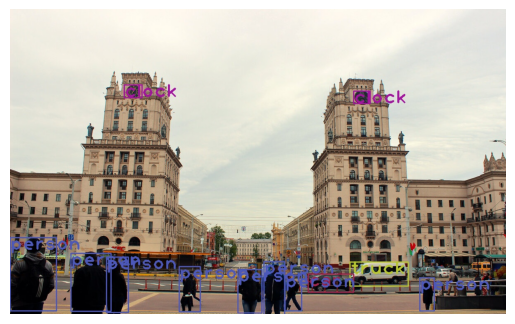

In [55]:
img = mpimg.imread('detected_image2.jpg')
plt.imshow(img)
plt.axis('off') 
plt.show()

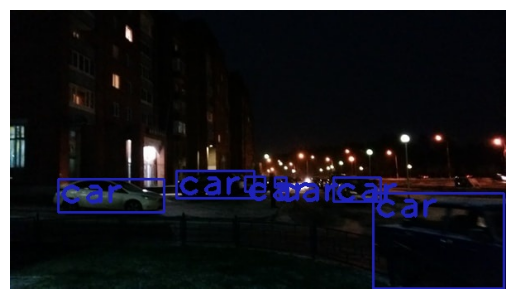

In [76]:
img = mpimg.imread('detected_image3.jpg')
plt.imshow(img)
plt.axis('off') 
plt.show()

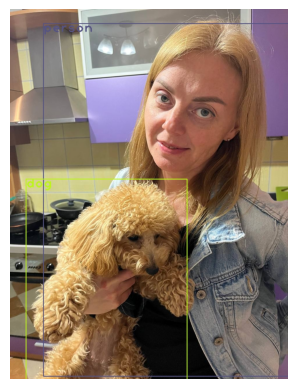

In [88]:
img = mpimg.imread('detected_image4.jpg')
plt.imshow(img)
plt.axis('off') 
plt.show()

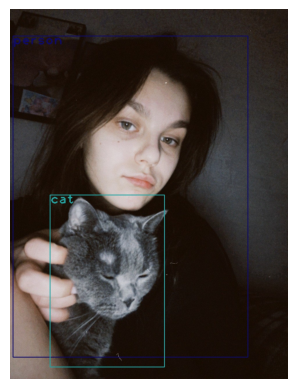

In [100]:
img = mpimg.imread('detected_image5.jpg')
plt.imshow(img)
plt.axis('off') 
plt.show()

In [101]:
cap = cv2.VideoCapture('viddetectMP4.MP4')

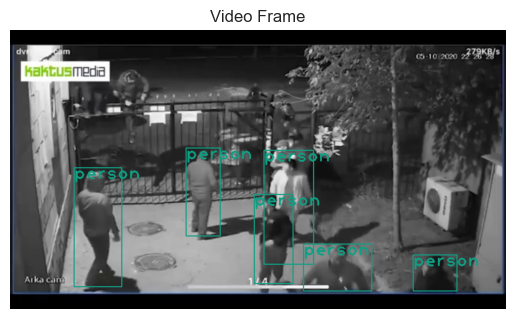

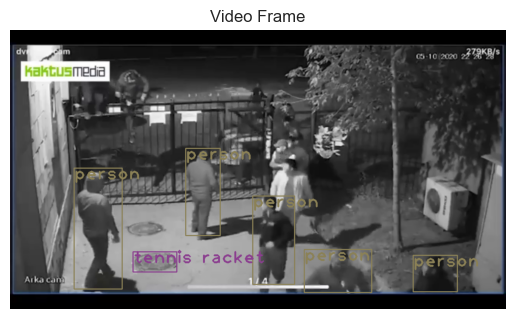

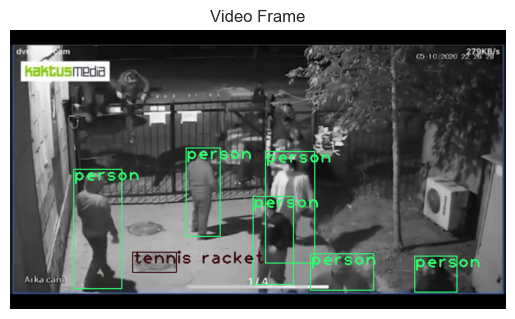

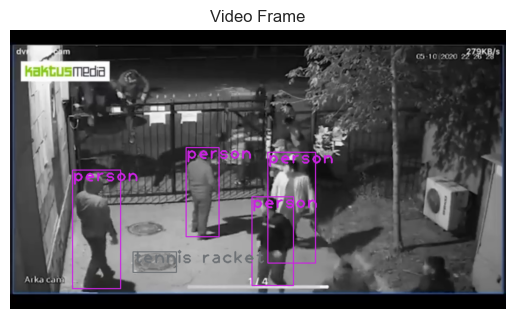

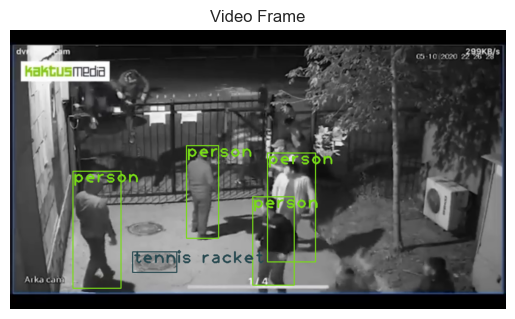

...

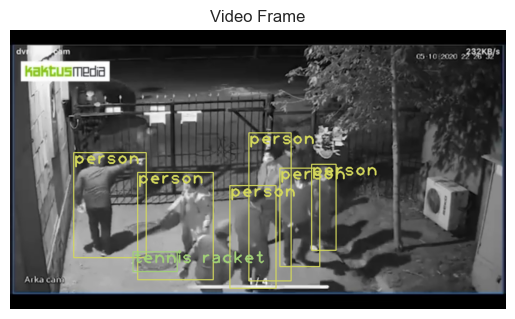

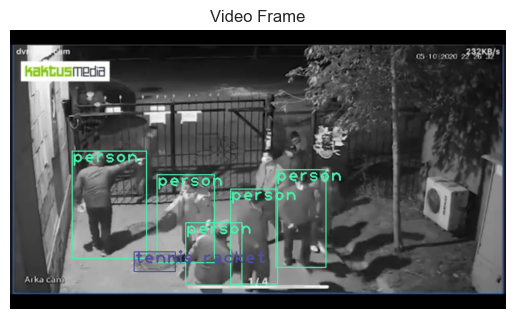

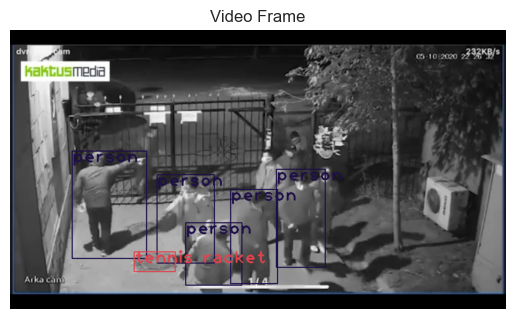

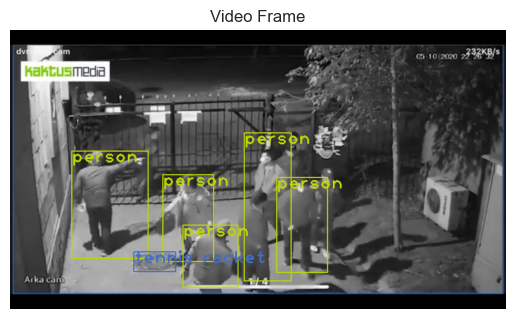

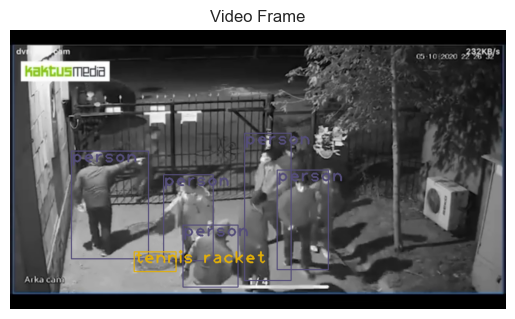

KeyboardInterrupt: 

In [103]:
plt.ion() 

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    height, width, channels = frame.shape
    blob = cv2.dnn.blobFromImage(frame, 0.00392, (416, 416), (0, 0, 0), True, crop=False)
    net.setInput(blob)
    outs = net.forward(output_layers)
    class_ids = []
    confidences = []
    boxes = []
    for out in outs:
        for detection in out:
            scores = detection[5:]
            class_id = np.argmax(scores)
            confidence = scores[class_id]
            if confidence > 0.5:
    
                center_x = int(detection[0] * width)
                center_y = int(detection[1] * height)
                w = int(detection[2] * width)
                h = int(detection[3] * height)

                x = int(center_x - w / 2)
                y = int(center_y - h / 2)

                boxes.append([x, y, w, h])
                confidences.append(float(confidence))
                class_ids.append(class_id)
    indexes = cv2.dnn.NMSBoxes(boxes, confidences, 0.5, 0.4)
    font = cv2.FONT_HERSHEY_PLAIN
    colors = np.random.uniform(0, 255, size=(len(classes), 3))
    for i in range(len(boxes)):
        if i in indexes:
            x, y, w, h = boxes[i]
            label = str(classes[class_ids[i]])
            color = colors[class_ids[i]]
            cv2.rectangle(frame, (x, y), (x + w, y + h), color, 2)
            cv2.putText(frame, label, (x, y + 30), font, 3, color, 3)
    plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title('Video Frame')
    plt.pause(0.001)

cap.release()
plt.ioff() 
plt.show() 